### problem Statement:
This data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker (Data Mining and Visualization, Silicon Graphics). A set of reasonably clean records was extracted using the following conditions: ((AAGE>16) && (AGI>100) && (AFNLWGT>1) && (HRSWK>0))
The weights on the Current Population Survey (CPS) files are controlled to independent estimates of the civilian non-institutional population of the US. These are prepared monthly for us by Population Division here at the Census Bureau. We use 3 sets of controls. These are:

A single cell estimate of the population 16+ for each state.

Controls for Hispanic Origin by age and sex.

Controls by Race, age and sex.

We use all three sets of controls in our weighting program and "rake" through them 6 times so that by the end we come back to all the controls we used. The term estimate refers to population totals derived from CPS by creating "weighted tallies" of any specified socio-economic characteristics of the population. People with similar demographic characteristics should have similar weights. There is one important caveat to remember about this statement. That is that since the CPS sample is actually a collection of 51 state samples, each with its own probability of selection, the statement only applies within state.

### Implementations:
The prediction task is to determine whether a person makes over $50K a year.

In [3]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier

Imported Important Library.

In [4]:
df_census=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset1/master/census_income.csv')
df_census.head(5)

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


Displayed Dataset in details.

In [5]:
df_census.shape

(32560, 15)

There are 32560 rows and 15 columns are present in dataset.

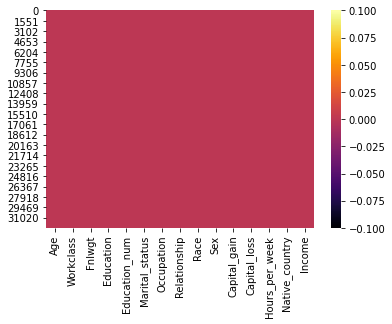

In [6]:
sns.heatmap(df_census.isnull(), cmap = 'inferno')

Displayed graphysical representation of null value, there are no any null value is present in data sett.

In [7]:
df_census.nunique()

Age                  73
Workclass             9
Fnlwgt            21647
Education            16
Education_num        16
Marital_status        7
Occupation           15
Relationship          6
Race                  5
Sex                   2
Capital_gain        119
Capital_loss         92
Hours_per_week       94
Native_country       42
Income                2
dtype: int64

There are no of unique value present in each columns.

In [8]:
df_census.Workclass.value_counts()

 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1297
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: Workclass, dtype: int64

In Workclass there are 9 unique value are present.

In [9]:
df_census['Workclass'] = df_census['Workclass'].str.replace('Never-worked', 'Without-pay')

In work class, majority of the people are private employees. The minority of people are either working without-pay or they have never-worked. We can combine the values of these two values as one. first we remove the blank space from the column is present in any values.

In [10]:
df_census['Workclass'] = df_census['Workclass'].replace('?', np.NaN)

Now, we have 8 unique values in this feature. But, we see that there are some values where we have '?' in the column. This values can be replaced with NaN values.

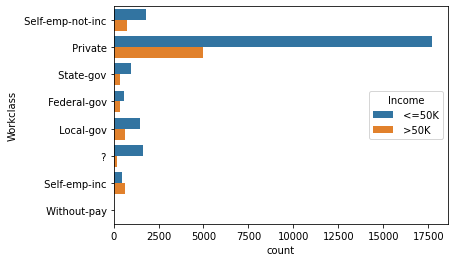

In [11]:
sns.countplot(y='Workclass', hue='Income', data = df_census)

We see that the majority of people who have income more than 50K a year are from private sector. Same goes for the people with income less than 50K. But for the Self Employed sector, the number of people whose income > 50K are more than the number of people whose income < 50K.

In [12]:
from scipy.stats import mode
workclass_mode = df_census.pivot_table(values='Workclass', columns='Occupation',aggfunc=(lambda x:mode(x).mode[0]))
workclass_mode

Occupation,?,Adm-clerical,Armed-Forces,Craft-repair,Exec-managerial,Farming-fishing,Handlers-cleaners,Machine-op-inspct,Other-service,Priv-house-serv,Prof-specialty,Protective-serv,Sales,Tech-support,Transport-moving
Workclass,?,Private,Federal-gov,Private,Private,Private,Private,Private,Private,Private,Private,Local-gov,Private,Private,Private


We will replace the NaN values in the 'Workclass' feature by the mode of the column, grouping it by the 'Occupation' feature. We now have 7 unique values in Workclass feature. We can encode these values using the frequency encoding technique.

In [13]:
loc1 = df_census['Workclass'].isnull()
df_census.loc[loc1, 'Workclass'] = df_census.loc[loc1,'Occupation'].apply(lambda x: workclass_mode[x])

In [14]:
le=LabelEncoder()
df_census['Workclass']=le.fit_transform(df_census['Workclass'])
df_census['Workclass']

0        5
1        3
2        3
3        3
4        3
        ..
32555    3
32556    3
32557    3
32558    3
32559    4
Name: Workclass, Length: 32560, dtype: int64

'Occupation': Similar to 'Workclass', we will look at the unique values and value counts in the 'Occupation' feature.

In [15]:
df_census.Occupation.value_counts()

 Prof-specialty       4140
 Craft-repair         4099
 Exec-managerial      4066
 Adm-clerical         3769
 Sales                3650
 Other-service        3295
 Machine-op-inspct    2002
 ?                    1843
 Transport-moving     1597
 Handlers-cleaners    1370
 Farming-fishing       994
 Tech-support          928
 Protective-serv       649
 Priv-house-serv       149
 Armed-Forces            9
Name: Occupation, dtype: int64

We will drop the rows where the occupation is NaN.

In [16]:
df_census['Occupation'] = df_census['Occupation'].replace('?', np.NaN)
df_census = df_census.loc[df_census['Occupation'].isnull() == False]
df_census

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,5,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,3,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,3,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,3,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,3,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,3,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,3,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,3,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,3,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


As we cannn see that after removing the null values from 'occupation', we are left with 30718 observations.

In [17]:
df_census.drop(['Education'], axis = 1, inplace = True)

We see that for the feature 'Education', we already have the encoded values in feature 'Education_num'. 'Education' will be removed from the dataset.

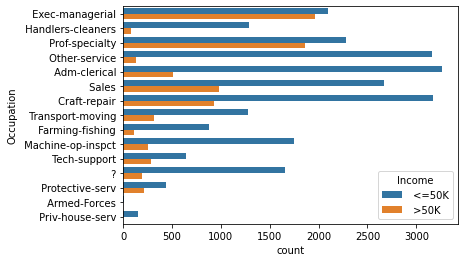

In [18]:
sns.countplot(y='Occupation', hue='Income', data = df_census)

The variables workClass, occupation, native-country have missing values. We will replace the missing values in each column with the most_frequent occurring value of that column.

In [19]:
le=LabelEncoder()
df_census['Occupation']=le.fit_transform(df_census['Occupation'])
df_census['Occupation']

0         4
1         6
2         6
3        10
4         4
         ..
32555    13
32556     7
32557     1
32558     1
32559     4
Name: Occupation, Length: 32560, dtype: int64

Majority of people whose income is greater than 50K are either executive managers or they belong to any professional speciality. Now, encoding the occupation by frequency of the values in the column.

'Native_country': We are checking for the salary on people in USA and outside USA, so , we will convert all the values where country is not USA to 'non-usa'. This way, we can encode the values by one-hot encoding without increasing the curse of dimensionality.

In [20]:
df_census['Native_country'][0]

' United-States'

In [21]:
df_census['Native_country'].loc[df_census['Native_country'] ==' United-States'] = 'usa'
df_census['Native_country'].loc[df_census['Native_country'] !='usa'] = 'non_usa'
df_census['Native_country'].value_counts()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


usa        29169
non_usa     3391
Name: Native_country, dtype: int64

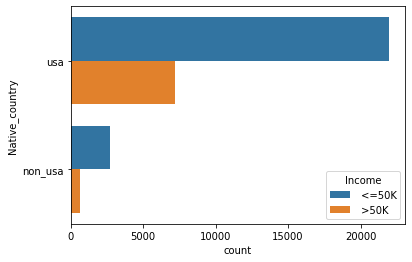

In [22]:
sns.countplot(y = df_census['Native_country'], hue = df_census['Income'])

Majority of people with higher income belong to the USA. We also have more number of people from USA then any other country combined in this dataset. Encoding this feature using one hot encoding.

In [23]:
df_census['country_enc'] = df_census['Native_country'].map({'usa' : 1, 'non_usa' : 0})
df_census.drop(['Native_country'], axis = 1, inplace = True)

'Sex': Similarly, encoding the sex using one hot encoding.

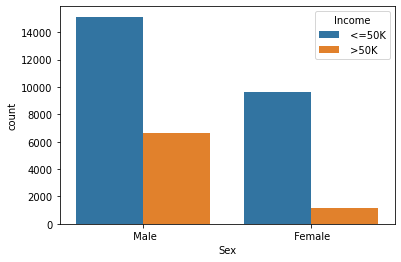

In [24]:
sns.countplot(x = df_census['Sex'], hue = df_census['Income'])

We can see that male have more salary than female. Also in the dataset, the number of men are more than women. Encoding this feature with one hot encoding.

In [25]:
le=LabelEncoder()
df_census['Sex']=le.fit_transform(df_census['Sex'])
df_census['Sex']


0        1
1        1
2        1
3        0
4        0
        ..
32555    0
32556    1
32557    0
32558    1
32559    0
Name: Sex, Length: 32560, dtype: int64

'Marital_status': Looking at the iincome of people according to their marital status.

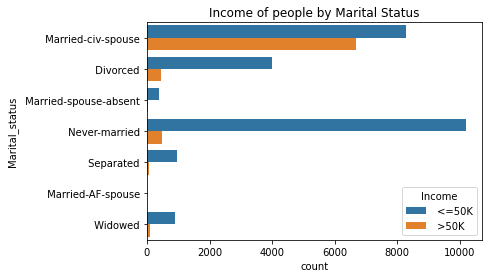

In [26]:
plt.title("Income of people by Marital Status")
sns.countplot(y = df_census['Marital_status'], hue = df_census['Income'])

Married people have a higher income as compared to others.

In [27]:
le=LabelEncoder()
df_census['Marital_status']=le.fit_transform(df_census['Marital_status'])
df_census['Marital_status']

0        2
1        0
2        2
3        2
4        2
        ..
32555    2
32556    2
32557    6
32558    4
32559    2
Name: Marital_status, Length: 32560, dtype: int64

Convert Marital_status categorical column to integer dtype.

Text(0.5, 1.0, 'Income respective to Race')

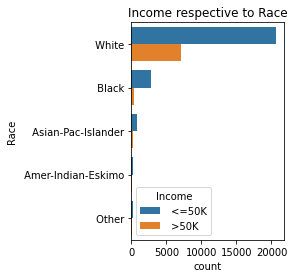

In [28]:
plt.subplot(1, 2, 1)
sns.countplot(y = df_census['Race'], hue = df_census['Income'])
plt.title("Income respective to Race", fontsize = 12)

Income respective to race white is high.

Text(0.5, 1.0, 'Income respective to Relationship')

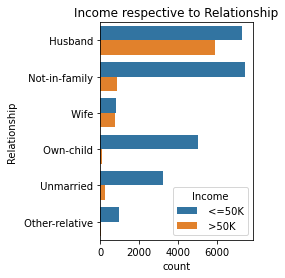

In [29]:
plt.subplot(1, 2, 2)
sns.countplot(y = df_census['Relationship'], hue = df_census['Income'])
plt.title("Income respective to Relationship", fontsize = 12)

White people have a higher salary as compared to other races. Similarly, husband in the family have a higher salary as compared to other relationship in the family. Encoding both these columns

In [30]:
le=LabelEncoder()
df_census['Income']=le.fit_transform(df_census['Income'])
df_census['Income']


0        0
1        0
2        0
3        0
4        0
        ..
32555    0
32556    1
32557    0
32558    0
32559    1
Name: Income, Length: 32560, dtype: int64

In the problem, we have 'Income' as the Target variable. we see that we have only two values which are to be predicted, either the income is greater than 50K, which is Yes, or the income is less than or equal to 50K, which is No. We will label encode the target variable.

In [31]:
race_enc = (df_census.groupby('Race').size()) / len(df_census)
print(race_enc,'\n')
df_census['race_enc'] = df_census['Race'].apply(lambda x : race_enc[x])

relationship_enc = (df_census.groupby('Relationship').size()) / len(df_census)
print(relationship_enc)
df_census['relationship_enc'] = df_census['Relationship'].apply(lambda x : relationship_enc[x])

Race
 Amer-Indian-Eskimo    0.009552
 Asian-Pac-Islander    0.031910
 Black                 0.095946
 Other                 0.008323
 White                 0.854269
dtype: float64 

Relationship
 Husband           0.405190
 Not-in-family     0.255037
 Other-relative    0.030129
 Own-child         0.155651
 Unmarried         0.105835
 Wife              0.048157
dtype: float64


In [32]:
df_census.drop(['Race', 'Relationship'], axis = 1, inplace = True)
df_census_new = df_census.drop(['Income'], axis = 1)
df_census_new['Income'] = df_census['Income']
df_census_new

,Age,Workclass,Fnlwgt,Education_num,Marital_status,Occupation,Sex,Capital_gain,Capital_loss,Hours_per_week,country_enc,race_enc,relationship_enc,Income
0,50,5,83311,13,2,4,1,0,0,13,1,0.854269,0.405190,0
1,38,3,215646,9,0,6,1,0,0,40,1,0.854269,0.255037,0
2,53,3,234721,7,2,6,1,0,0,40,1,0.095946,0.405190,0
3,28,3,338409,13,2,10,0,0,0,40,0,0.095946,0.048157,0
4,37,3,284582,14,2,4,0,0,0,40,1,0.854269,0.048157,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,3,257302,12,2,13,0,0,0,38,1,0.854269,0.048157,0
32556,40,3,154374,9,2,7,1,0,0,40,1,0.854269,0.405190,1
32557,58,3,151910,9,6,1,0,0,0,40,1,0.854269,0.105835,0
32558,22,3,201490,9,4,1,1,0,0,20,1,0.854269,0.155651,0


In [33]:
print(df_census_new.skew())
print("Total count of numeric features: ",len(df_census_new.skew()))
print("count of features which are significantly skewed: ",len(df_census_new.skew().loc[abs(df_census_new.skew())>0.5]))

Age                  0.558738
Workclass           -0.079074
Fnlwgt               1.446972
Education_num       -0.311630
Marital_status      -0.013448
Occupation           0.114540
Sex                 -0.719244
Capital_gain        11.953690
Capital_loss         4.594549
Hours_per_week       0.227636
country_enc         -2.592057
race_enc            -2.018274
relationship_enc    -0.254826
Income               1.212383
dtype: float64
Total count of numeric features:  14
count of features which are significantly skewed:  8


As per aboveb skew data need to be consider.

In [34]:
import numpy as np
for index in df_census_new.skew().index:
    if df_census_new.skew().loc[index]>0.5:
        df_census_new[index]=np.cbrt(df_census_new[index])
    if df_census_new.skew().loc[index]<-0.5:
        df_census_new[index]=np.square(df_census_new[index])
print(df_census_new.skew())
print("Total count of numeric features: ",len(df_census_new.skew()))
print("count of features which are significantly skewed: ",len(df_census_new.skew().loc[abs(df_census_new.skew())>0.5]))

Age                 0.090565
Workclass          -0.079074
Fnlwgt             -0.164177
Education_num      -0.311630
Marital_status     -0.013448
Occupation          0.114540
Sex                -0.719244
Capital_gain        4.100150
Capital_loss        4.336999
Hours_per_week      0.227636
country_enc        -2.592057
race_enc           -2.008370
relationship_enc   -0.254826
Income              1.212383
dtype: float64
Total count of numeric features:  14
count of features which are significantly skewed:  6


In [35]:
df_census_new.head(5)

,Age,Workclass,Fnlwgt,Education_num,Marital_status,Occupation,Sex,Capital_gain,Capital_loss,Hours_per_week,country_enc,race_enc,relationship_enc,Income
0,3.684031,5,43.675121,13,2,4,1,0.0,0.0,13,1,0.729776,0.405190,0.0
1,3.361975,3,59.967204,9,0,6,1,0.0,0.0,40,1,0.729776,0.255037,0.0
2,3.756286,3,61.685627,7,2,6,1,0.0,0.0,40,1,0.009206,0.405190,0.0
3,3.036589,3,69.686283,13,2,10,0,0.0,0.0,40,0,0.009206,0.048157,0.0
4,3.332222,3,65.776255,14,2,4,0,0.0,0.0,40,1,0.729776,0.048157,0.0


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn

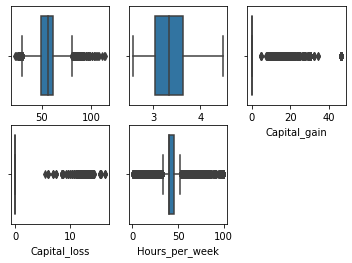

In [36]:
list=['Fnlwgt','Age','Capital_gain','Capital_loss','Hours_per_week']
for i in range(0, len(list)):
    plt.subplot(2,3, i+1)
    sns.boxplot(df_census_new[list[i]])

As per aboveb result Capital_loss and Capital_gain present high outliers.

In [37]:
from scipy.stats import zscore
z_score=abs(zscore(df_census_new.loc[:,'Fnlwgt':'Hours_per_week']))
print(df_census_new.shape)
df_x_final=df_census_new.loc[(z_score<3).all(axis=1)]
print(df_x_final.shape)

(32560, 14)
(29231, 14)


As per aboveb result less than 10% data are present as outliers.

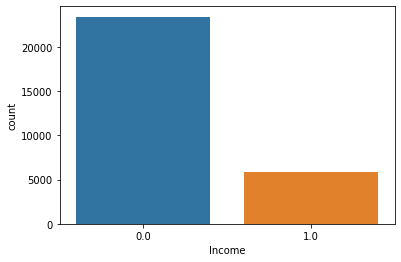

In [38]:
sns.countplot(x='Income',data=df_x_final)

As we can see that data is imbalanced. In order to remove the data imbalance, we use the SMOTETomek class 

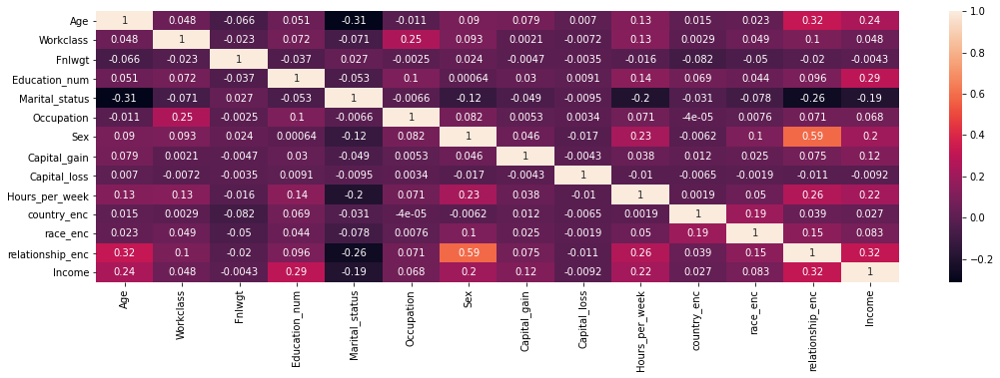

In [39]:
plt.figure(figsize=(18,5))
sns.heatmap(df_x_final.corr(), annot = True)

In [40]:
pip install -U dataprep

Requirement already up-to-date: dataprep in /usr/local/lib/python3.7/dist-packages (0.3.0)


DataPrep Report
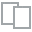
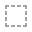
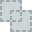
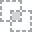
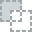
...
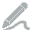
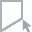
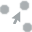
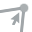
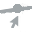

In [41]:
from dataprep.datasets import load_dataset
from dataprep.eda import create_report
create_report(df_x_final)

Using Dataprep Display all EDA graphysical representations.

In [42]:
df_x=df_x_final.drop(columns=["Income"])
y=df_x_final[["Income"]]
print(df_x.shape,y.shape)

(29231, 13) (29231, 1)


In [43]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
sc.fit(df_x)
x=sc.transform(df_x)
x=pd.DataFrame(x,columns=df_x.columns)

In [44]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(x,y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

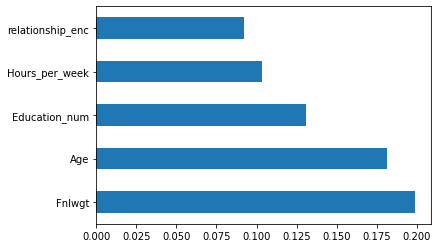

In [45]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

In [46]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
def max_aucroc_score(clf,df_x,y):
    max_aucroc_score=0
    for r_state in range(42,100):
        x_train, x_test, y_train, y_test = train_test_split(df_x, y,random_state = r_state,test_size=0.20,stratify=y)
        x_train, y_train = SMOTE().fit_sample(x_train, y_train)
        clf.fit(x_train,y_train)
        y_pred = clf.predict(x_test)
        aucroc_scr=roc_auc_score(y_test,y_pred)
        print("auc roc score corresponding to ",r_state," is ",aucroc_scr)
        if aucroc_scr>max_aucroc_score:
            max_aucroc_score=aucroc_scr
            final_r_state=r_state
    print("max auc roc score corresponding to ",final_r_state," is ",max_aucroc_score)
    return final_r_state

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


Data is imbalance so applied SMOTE and we will focus on auc-roc score and build a functions for finding random state where auc roc is maximum.

In [47]:
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")
lg_clf=LogisticRegression()
max_aucroc_score(lg_clf,x,y)

auc roc score corresponding to  42  is  0.7650955261039906
auc roc score corresponding to  43  is  0.7660788372233722
auc roc score corresponding to  44  is  0.7686599945366512
auc roc score corresponding to  45  is  0.7648900088550252
auc roc score corresponding to  46  is  0.7573158457282295
auc roc score corresponding to  47  is  0.7469912164751134
auc roc score corresponding to  48  is  0.7697581643147989
auc roc score corresponding to  49  is  0.7537412939336661
auc roc score corresponding to  50  is  0.766393163113962
auc roc score corresponding to  51  is  0.7552383981754616
auc roc score corresponding to  52  is  0.7543941457834131
auc roc score corresponding to  53  is  0.7660526204824247
auc roc score corresponding to  54  is  0.7636145552412398
auc roc score corresponding to  55  is  0.7628710448012936
auc roc score corresponding to  56  is  0.755893266697589
auc roc score corresponding to  57  is  0.7582729401066637
auc roc score corresponding to  58  is  0.7519379304908032

87

Using logistic regression find max auc roc score corresponding to  48  is  0.7703948827855012.

In [48]:
from sklearn.model_selection import cross_val_score
print("Mean roc auc score for logistic classifier: ",cross_val_score(lg_clf,x,y,cv=5,scoring="roc_auc").mean())
print("standard deviation in roc auc score for logistic classifier: ",cross_val_score(lg_clf,x,y,cv=5,scoring="roc_auc").std())
print(cross_val_score(lg_clf,x,y,cv=5,scoring="roc_auc"))

Mean roc auc score for logistic classifier:  0.8344931036242921
standard deviation in roc auc score for logistic classifier:  0.007897163084896274
[0.82001217 0.83592331 0.83426932 0.83868835 0.84357236]


In [49]:
from sklearn.tree import DecisionTreeClassifier
dc=DecisionTreeClassifier()
max_aucroc_score(dc,df_x,y)

auc roc score corresponding to  42  is  0.7025652989350136
auc roc score corresponding to  43  is  0.7002158756116474
auc roc score corresponding to  44  is  0.7115822078162556
auc roc score corresponding to  45  is  0.693459748135953
auc roc score corresponding to  46  is  0.6997947577518137
auc roc score corresponding to  47  is  0.6994602651374179
auc roc score corresponding to  48  is  0.6952691615959578
auc roc score corresponding to  49  is  0.6905602315873228
auc roc score corresponding to  50  is  0.7017069298363011
auc roc score corresponding to  51  is  0.6895769204679413
auc roc score corresponding to  52  is  0.6912070334199281
auc roc score corresponding to  53  is  0.7131820706825336
auc roc score corresponding to  54  is  0.7011891033691262
auc roc score corresponding to  55  is  0.7030025501738921
auc roc score corresponding to  56  is  0.707935147482918
auc roc score corresponding to  57  is  0.6953759535652018
auc roc score corresponding to  58  is  0.6988215299943349

59

In [51]:
print("Mean auc roc score for decision tree classifier: ",cross_val_score(dc,df_x,y,cv=5,scoring="roc_auc").mean())
print("standard deviation in auc roc score for decision tree classifier: ",cross_val_score(dc,df_x,y,cv=5,scoring="roc_auc").std())
print(cross_val_score(dc,df_x,y,cv=5,scoring="roc_auc"))

Mean auc roc score for decision tree classifier:  0.6970128313191689
standard deviation in auc roc score for decision tree classifier:  0.007999080031267421
[0.68487001 0.69195526 0.70751404 0.699763   0.6882832 ]


In [50]:
from sklearn.model_selection import GridSearchCV
n_estimators=[10,100,500]
criterion=['entropy','gini']
min_samples_split=[2,5,8]
min_samples_leaf=[1,2,4]
parameters={'n_estimators':n_estimators,'min_samples_split':min_samples_split,'min_samples_leaf':min_samples_leaf,'criterion':criterion}
rf_clf=RandomForestClassifier()
clf = GridSearchCV(rf_clf, parameters, cv=3,scoring="roc_auc")
clf.fit(df_x,y)
clf.best_params_

{'criterion': 'entropy',
 'min_samples_leaf': 4,
 'min_samples_split': 8,
 'n_estimators': 500}

In [52]:
rf_clf=RandomForestClassifier(n_estimators=500,criterion='entropy',min_samples_leaf=4,min_samples_split=8,)
max_aucroc_score(rf_clf,df_x,y)

auc roc score corresponding to  42  is  0.7820006490018387
auc roc score corresponding to  43  is  0.7682808601291037
auc roc score corresponding to  44  is  0.7752687215947112
auc roc score corresponding to  45  is  0.7732114407657488
auc roc score corresponding to  46  is  0.77677792587079
auc roc score corresponding to  47  is  0.7687039946613182
auc roc score corresponding to  48  is  0.777730986904463
auc roc score corresponding to  49  is  0.7719501038586276
auc roc score corresponding to  50  is  0.7669872564638933
auc roc score corresponding to  51  is  0.7615166659638869
auc roc score corresponding to  52  is  0.7746199030897255
auc roc score corresponding to  53  is  0.7891960443887924
auc roc score corresponding to  54  is  0.7749342289803154
auc roc score corresponding to  55  is  0.7773078523722485
auc roc score corresponding to  56  is  0.7871589302836358
auc roc score corresponding to  57  is  0.7743841357550513
auc roc score corresponding to  58  is  0.7741826518508469


92

In [53]:
#Lets choose svm as our final model and random state 82
x_train, x_test, y_train, y_test = train_test_split(x, y,random_state = 92,test_size=0.20,stratify=y)
x_train, y_train = SMOTE().fit_sample(x_train, y_train)
rf=RandomForestClassifier(n_estimators=500,criterion='entropy',min_samples_leaf=4,min_samples_split=8)
rf.fit(x_train,y_train)
y_pred=rf.predict(x_test)

In [54]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
print("Confusion matrix \n",confusion_matrix(y_test,y_pred))
print("f1 score is : ",f1_score(y_test,y_pred))
print("classification report \n",classification_report(y_test,y_pred))
print("AUC ROC Score: ",roc_auc_score(y_test,y_pred))

Confusion matrix 
 [[4055  627]
 [ 302  863]]
f1 score is :  0.6500941619585687
classification report 
               precision    recall  f1-score   support

         0.0       0.93      0.87      0.90      4682
         1.0       0.58      0.74      0.65      1165

    accuracy                           0.84      5847
   macro avg       0.75      0.80      0.77      5847
weighted avg       0.86      0.84      0.85      5847

AUC ROC Score:  0.8034277013784872


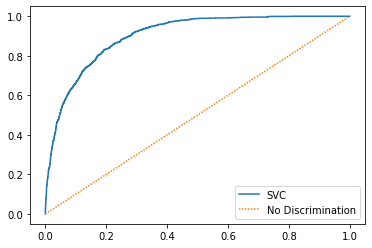

In [56]:
from sklearn.metrics import roc_curve,precision_recall_curve
fpr, tpr, thresholds = roc_curve(y_test,rf.predict_proba(x_test)[:,1],pos_label=1)
precision, recall, thresholds = precision_recall_curve(y_test,rf.predict_proba(x_test)[:,1],pos_label=1)
plt.plot(fpr, tpr, label='SVC')
plt.plot([0,1], [0,1], label='No Discrimination', linestyle='-', dashes=(1, 1))
plt.legend()

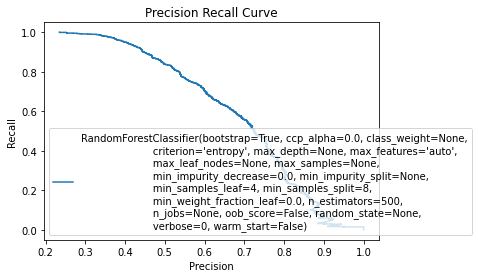

In [59]:
precision, recall, thresholds = precision_recall_curve(y_test,rf.predict_proba(x_test)[:,1],pos_label=1)
plt.plot(precision,recall, label=rf)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.title("Precision Recall Curve")
plt.legend()

In [60]:
#Lets save the model using joblib and pickle
import joblib
import pickle
joblib.dump(rf, 'rf_Census.obj')
pickle.dump(rf,open('rf_Census.pkl','wb'))

In [ ]:
from sklearn.svm import SVC
svc=SVC()
parameters={"kernel":["linear", "poly", "rbf"],"C":[0.1,1,10,100], 'gamma': [0.0001, 0.001,0.01, 0.1,1,10 ]}
clf = GridSearchCV(svc, parameters, cv=3,scoring="roc_auc")
clf.fit(x,y)
clf.best_params_

In [ ]:
svc=SVC(kernel="rbf",C=1,gamma=0.01)
max_aucroc_score(svc,x,y)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
parameters={"learning_rate":[0.001,0.01,0.1,1],"n_estimators":[10,100,500,1000]}
gb_clf=GradientBoostingClassifier()
clf = GridSearchCV(gb_clf, parameters, cv=5,scoring="roc_auc")
clf.fit(df_x,y)
clf.best_params_

In [ ]:
gb_clf=GradientBoostingClassifier(learning_rate=0.01,n_estimators=500)
max_aucroc_score(gb_clf,df_x,y)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
#parameters={"base_estimator":[dc,lg_clf,svc],"learning_rate":[0.001,0.01,0.1,1],"n_estimators":[10,100,500,1000]}
ada_clf=AdaBoostClassifier(base_estimator=svc,algorithm='SAMME')
max_aucroc_score(ada_clf,x,y)